<a href="https://colab.research.google.com/github/rndbblnn/stonks-jupyter/blob/main/downtrend-3updays-orl.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install yfinance
!pip install mplfinance

import yfinance as yf
import mplfinance as mpf
import matplotlib.pyplot as plt
import matplotlib.image  as m_img
import pandas as pd
import numpy as np 
import json
import requests
import urllib.parse
import base64
import warnings
import logging
import io
from datetime import datetime
from PIL import Image

warnings.filterwarnings('ignore')

baseurl = 'https://af1bbf696a14.ngrok.io';

def encodeUrl(arg):
  str = arg.replace('.','%2E')
  return urllib.parse.quote(str)

dummyImg = Image.new('RGB', (60, 30), color = 'black')
dummyImg.save('dummy.png')


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 62 kB 1.1 MB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 71 kB 3.6 MB/s 


In [2]:
## downtrend 3 up 1 down
q = '\
[d]L.0 < [d]L.1 \n\
AND [d]L.1 > [d]L.2 \n\
AND [d]C.1 > [d]O.1 \n\
AND [d]L.2 > [d]L.3 \n\
AND [d]C.2 > [d]O.2 \n\
AND [d]L.3 > [d]L.4 \n\
AND [d]C.3 > [d]O.3 \n\
AND (\n\
    [d]AVGC10.0 < [d]AVGC20.0 \n\
    AND [d]AVGC20.0 < [d]AVGC50.0 \n\
    AND [d]AVGC20.0 < [d]AVGC20.1 \n\
    AND [d]AVGC50.0 < [d]AVGC100.0 \n\
    AND [d]AVGC50.0 < [d]AVGC50.1 \n\
    AND [d]AVGC100.0 < [d]AVGC200.0 \n\
    AND [d]AVGC100.0 < [d]AVGC100.1 \n\
    AND [d]AVGC100.0 < [d]AVGC200.0 \n\
    AND [d]AVGC200.0 < [d]AVGC200.1 \n\
)\n\
AND (\n\
    [d]DV.0 > 1.0 \n\
    OR [d]MINDV3.1 > 2.0\n\
    OR [d]AVGDV20.0 > 3.0\n\
)\n\
AND (\n\
    [d]ATR1.0 > 8.0 \n\
    OR [d]ATR20.0 > 5.0 \n\
    OR [d]ATR20.20 > 5.0 \n\
    OR [d]ATR20.40 > 5.0 \n\
)\
';

try:
  r = requests.post(baseurl + '/search', data={'q': q})
  df = pd.DataFrame(r.json()['payload'])
except Exception as e:
  logging.error(f"Exception Name: {type(e).__name__}")
  logging.error(f"Exception Desc: {e}")
  print(r)
  print(r.text)
  raise e

df['patternTime'] = pd.to_datetime(df['patternTime'])
print(df.head)


<bound method NDFrame.head of    symbol patternTime
0     APP  2022-08-26
1    CDNA  2022-08-26
2      EB  2022-08-26
3     EQX  2022-08-26
4     FSM  2022-08-26
..    ...         ...
95   KSCP  2022-07-11
96   MRVL  2022-07-11
97   NKLA  2022-07-11
98   PTRA  2022-07-11
99   RGTI  2022-07-11

[100 rows x 2 columns]>


APP (2022-08-26)


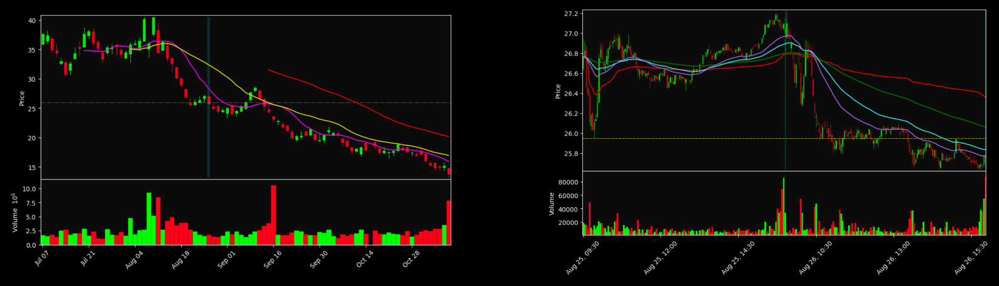

CDNA (2022-08-26)


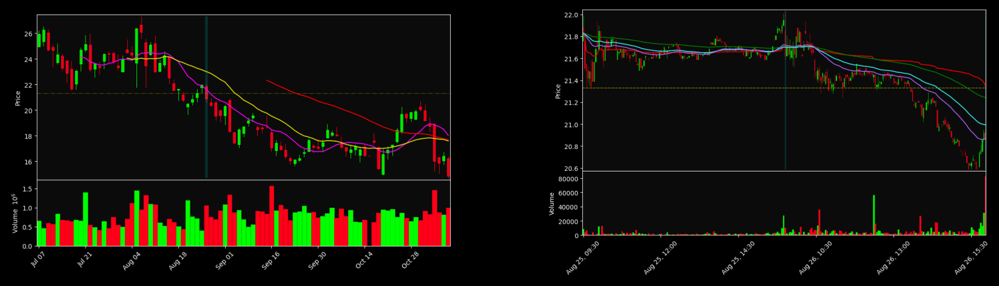

EB (2022-08-26)


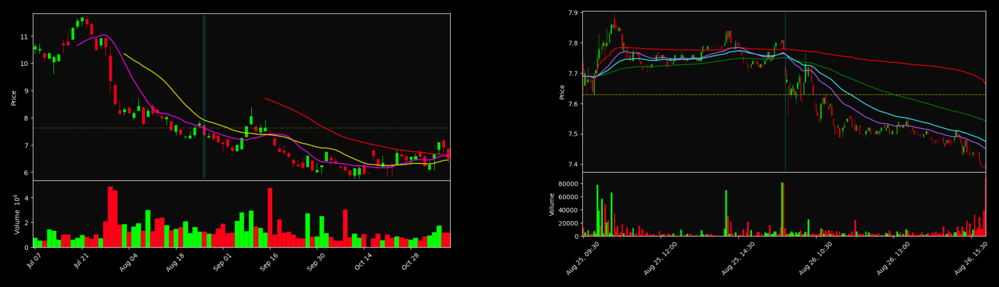

EQX (2022-08-26)


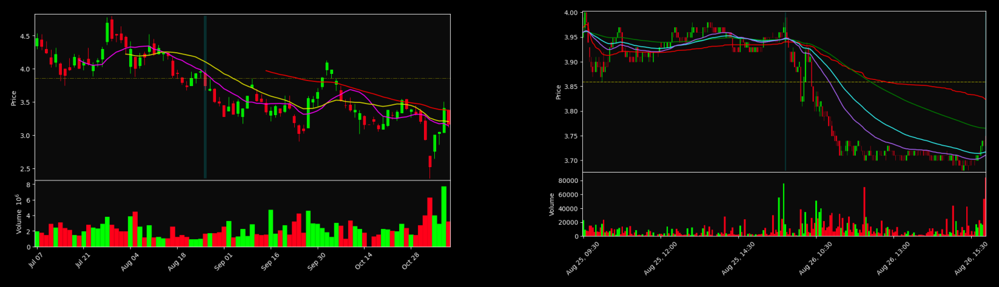

FSM (2022-08-26)


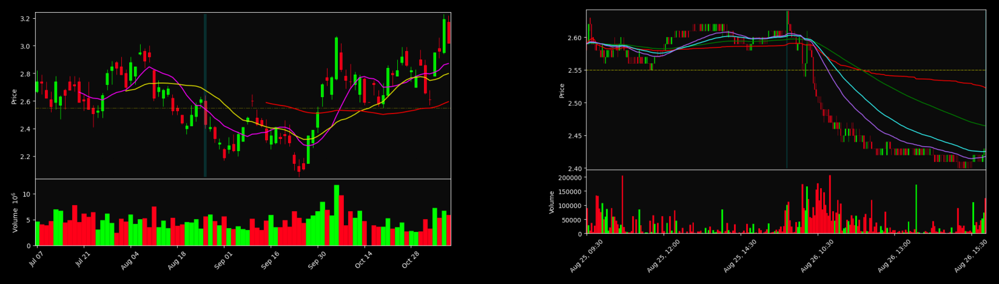

LAW (2022-08-26)


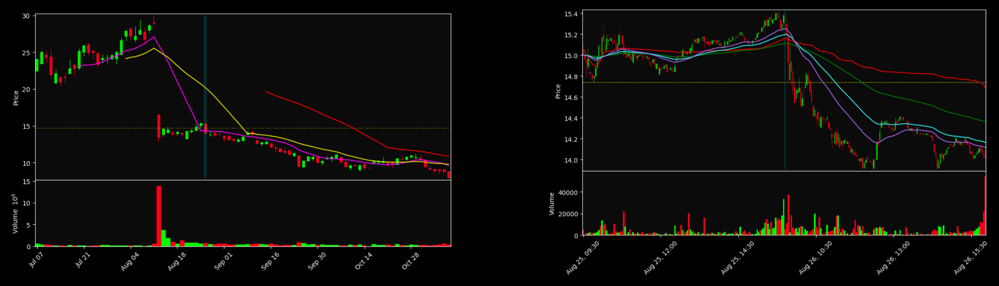

OII (2022-08-26)


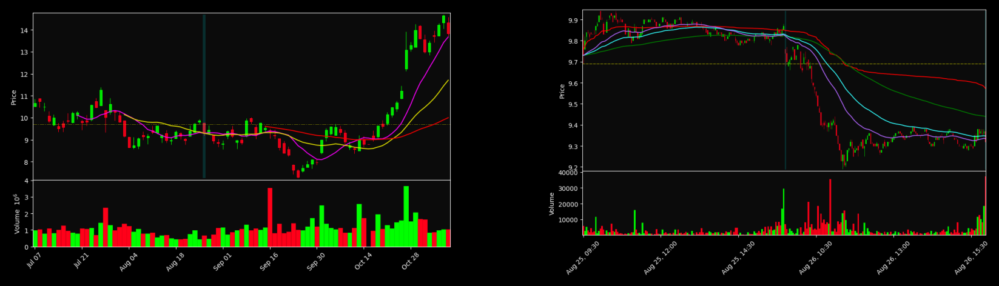

QTRX (2022-08-26)


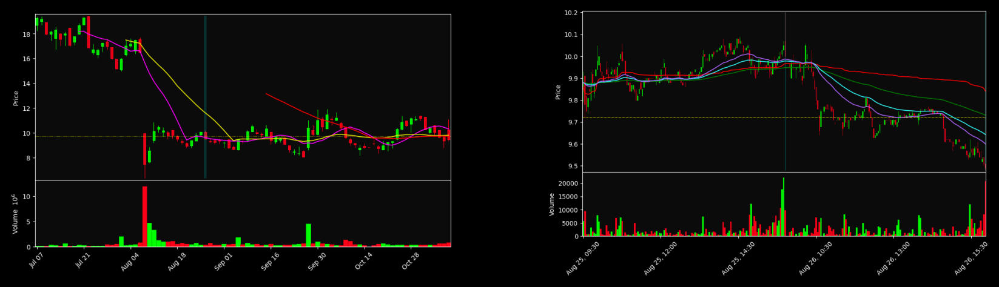

ALBO (2022-08-25)


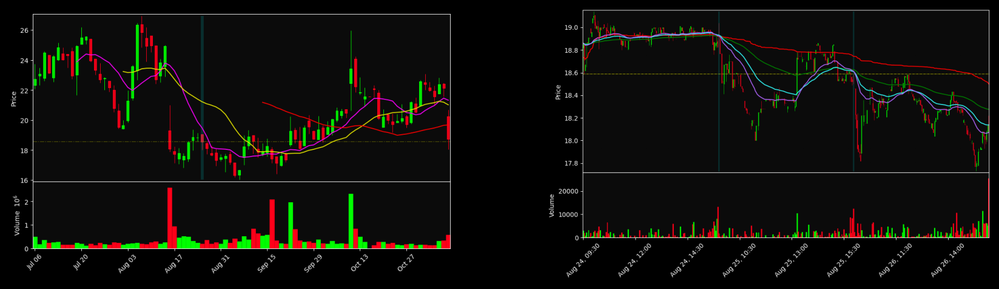

IHS (2022-08-16)


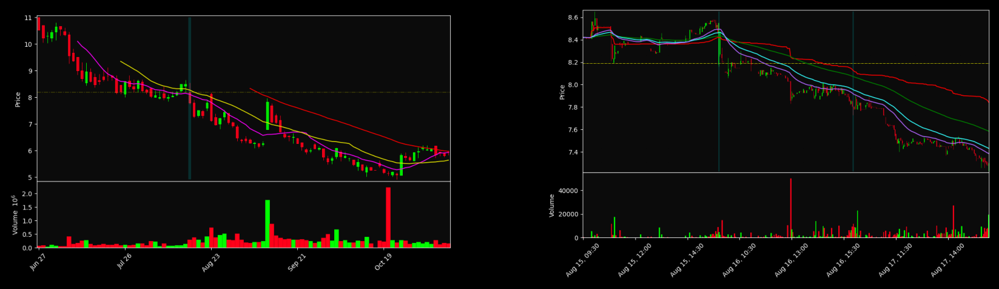

IAG (2022-08-15)


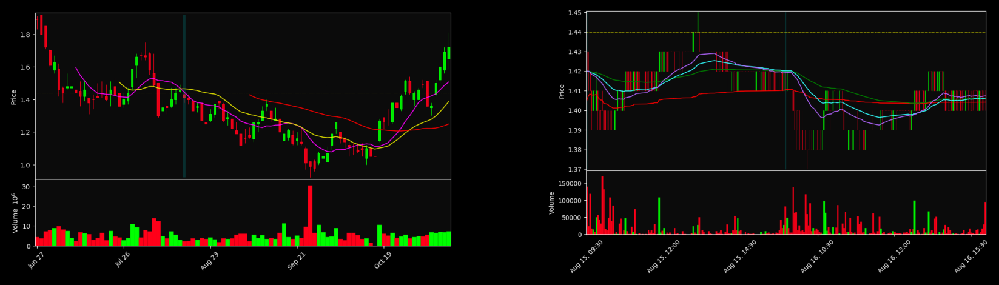

QTRX (2022-08-15)


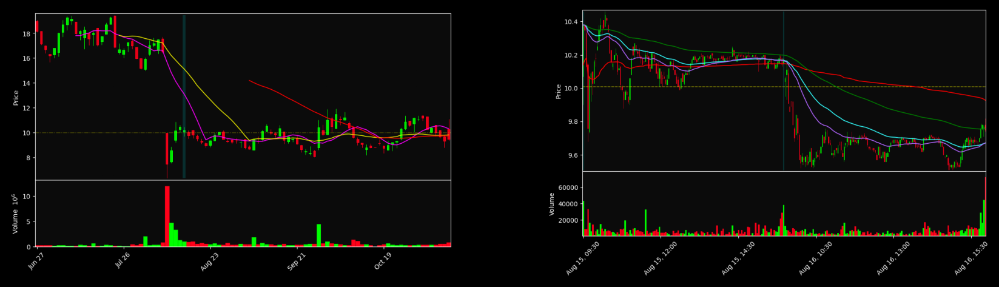

ADTX (2022-08-08)


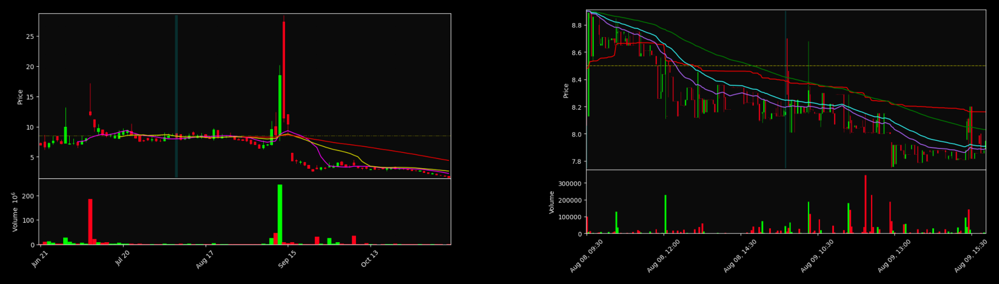

ATRA (2022-08-05)


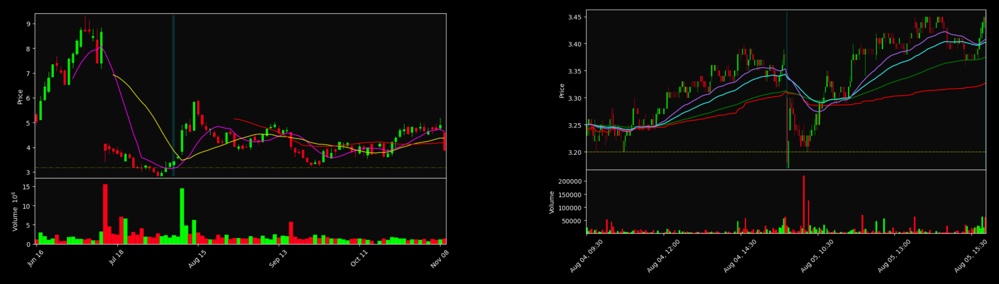

BLND (2022-08-05)


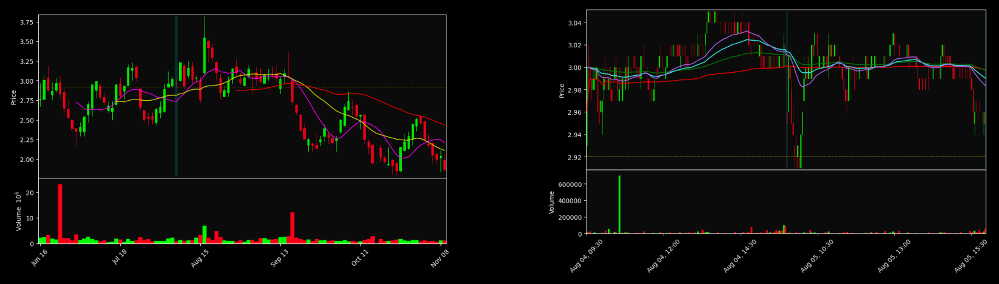

IAS (2022-08-05)


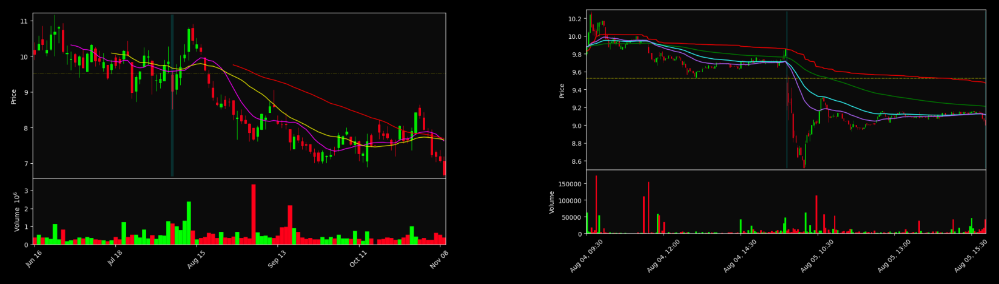

MRVI (2022-08-05)


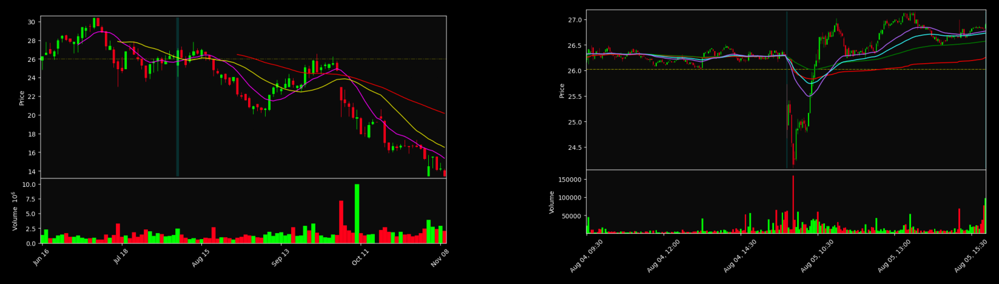

TXG (2022-08-05)


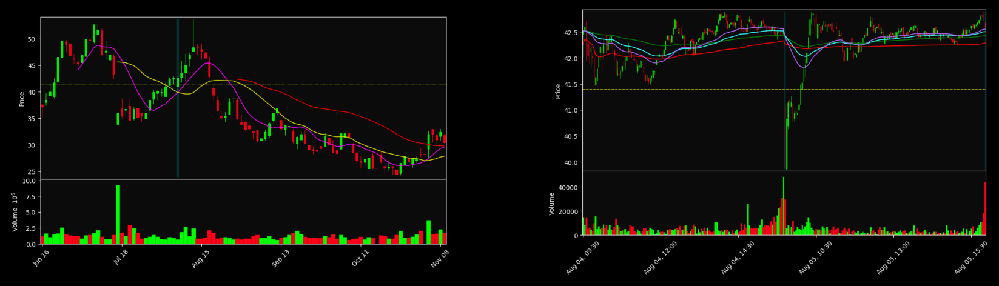

BAND (2022-08-04)


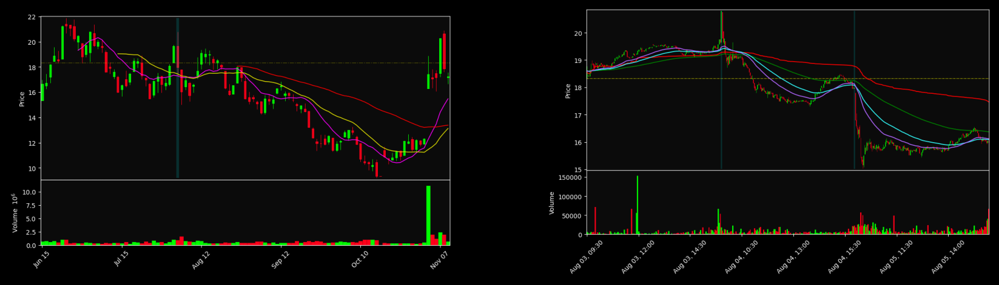

PEGA (2022-08-04)


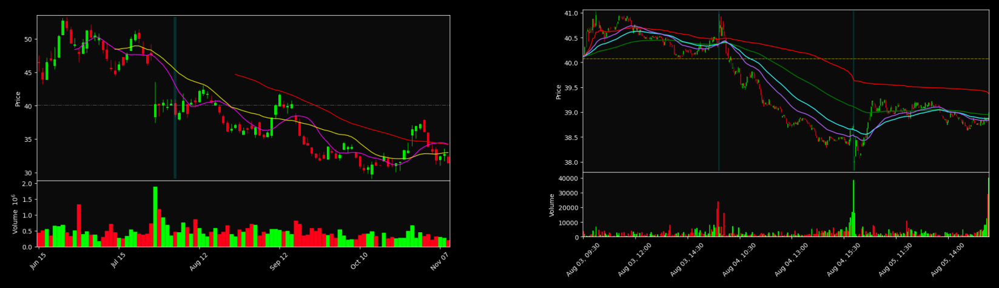

RVLV (2022-08-04)


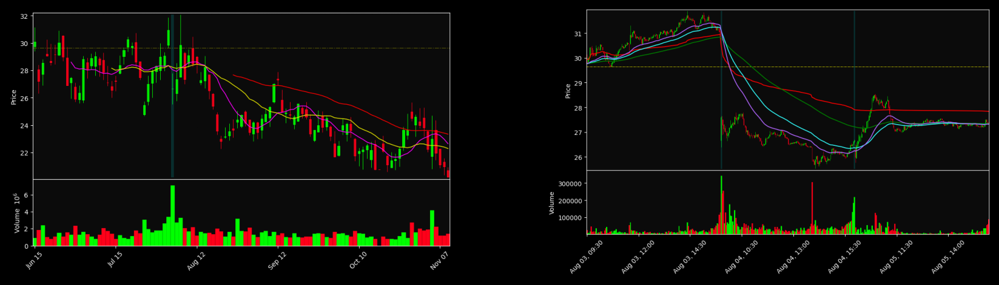

JCSE (2022-08-03)


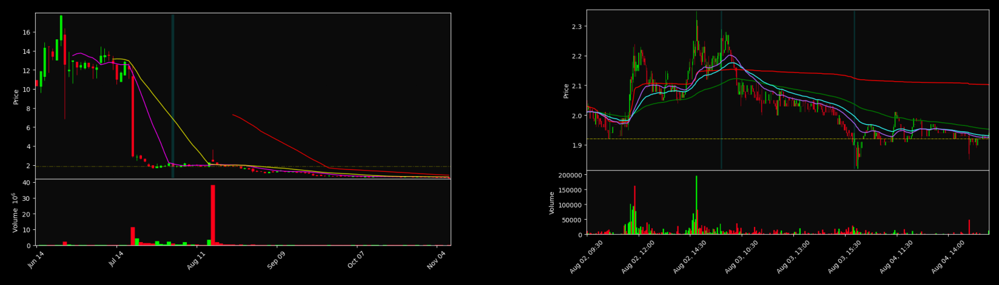

MHUA (2022-08-03)


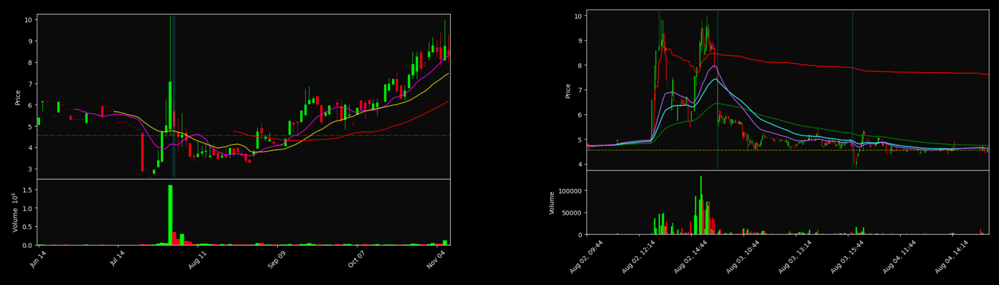

AZTA (2022-08-01)


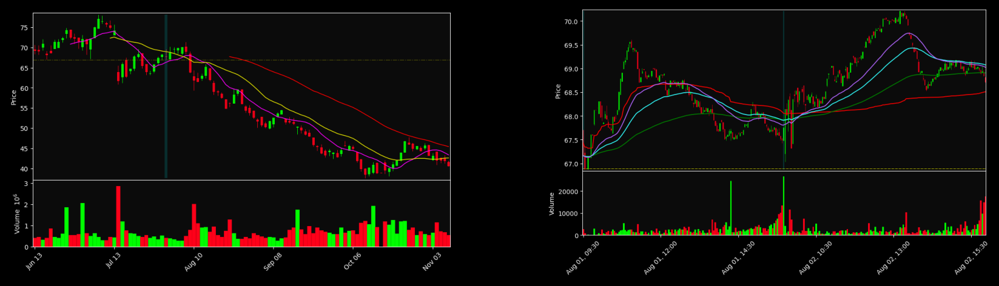

BIGC (2022-08-01)


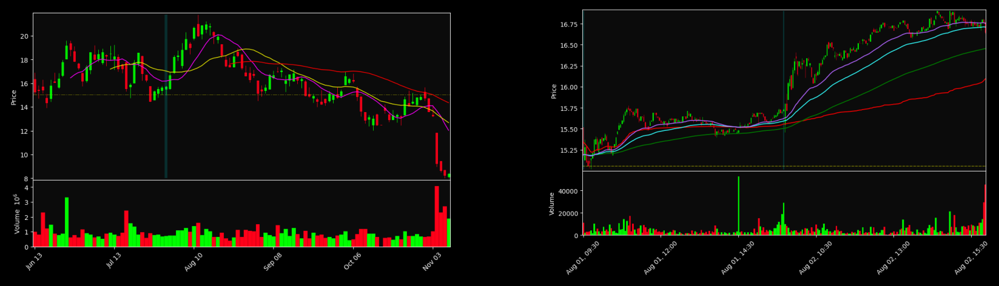

COMP (2022-08-01)


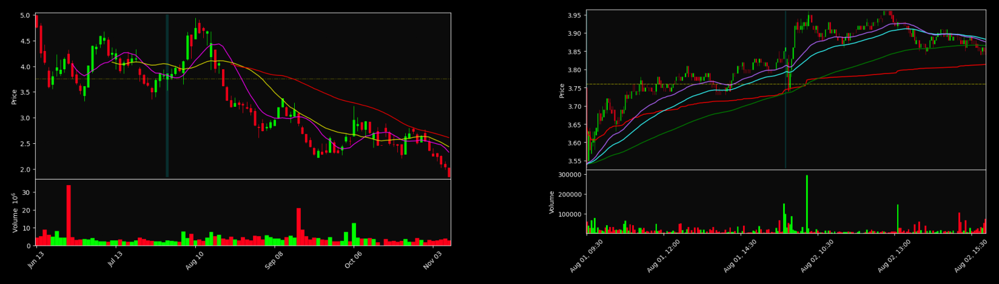

HASI (2022-08-01)


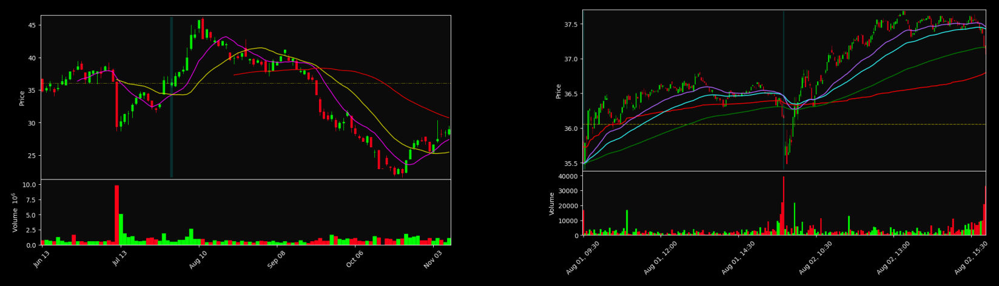

HSKA (2022-08-01)


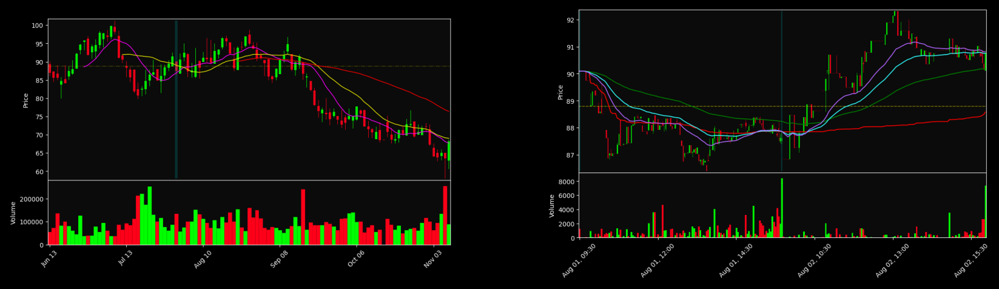

LIND (2022-08-01)


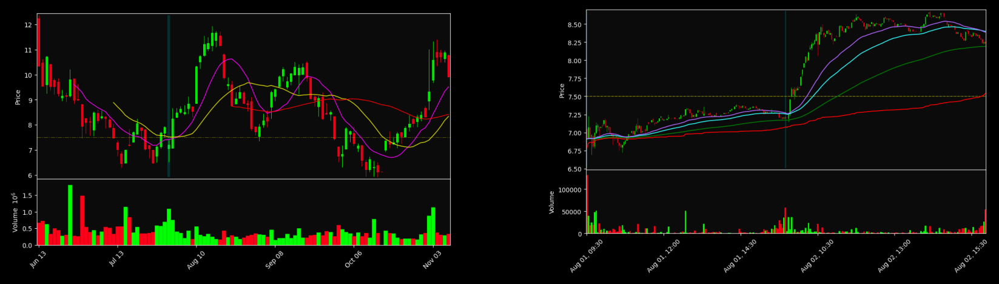

IAS (2022-07-29)


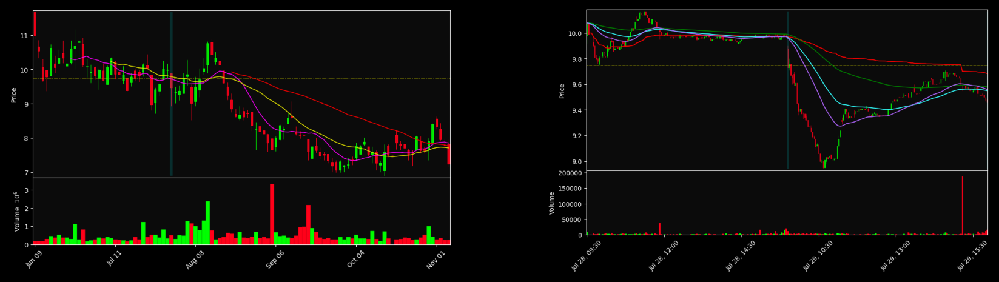

NVDS (2022-07-27)


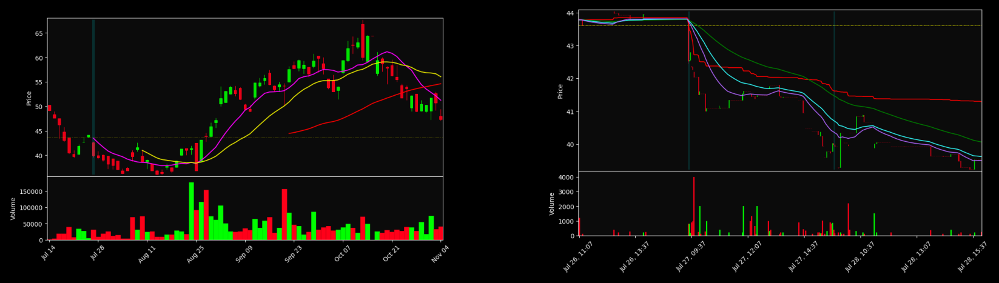

HSKA (2022-07-25)


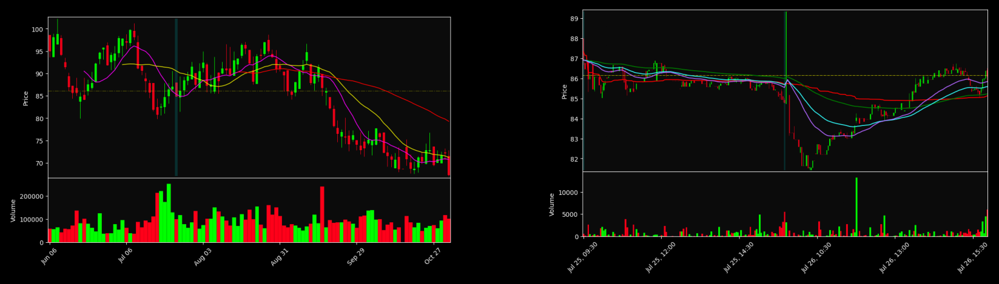

ADNT (2022-07-22)


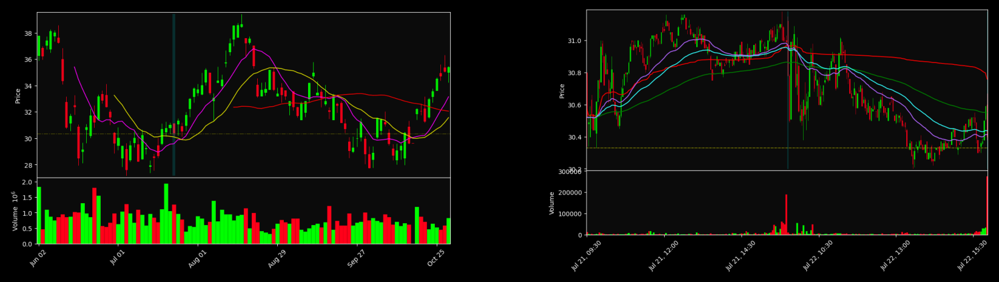

AZTA (2022-07-22)


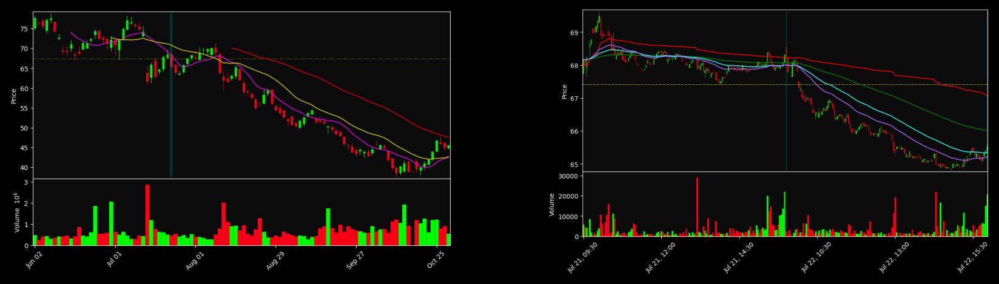

BAND (2022-07-22)


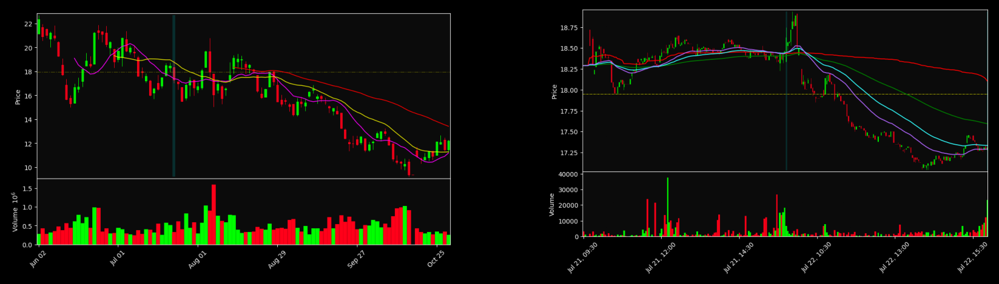

BFRI (2022-07-22)


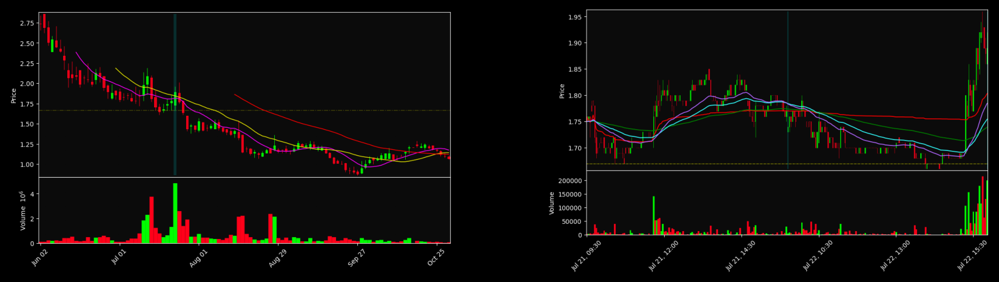

CRSR (2022-07-22)


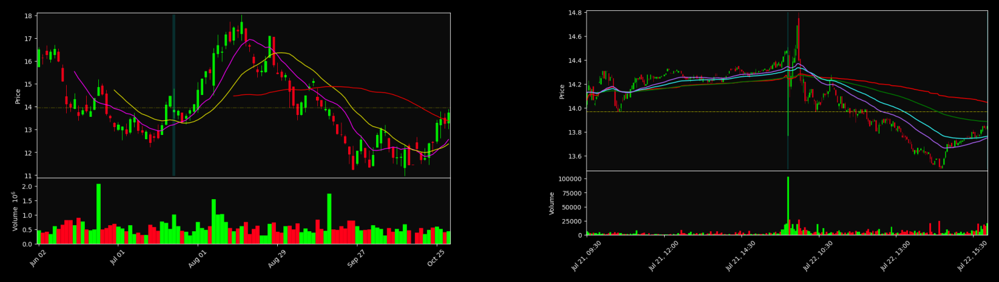

DCFC (2022-07-22)


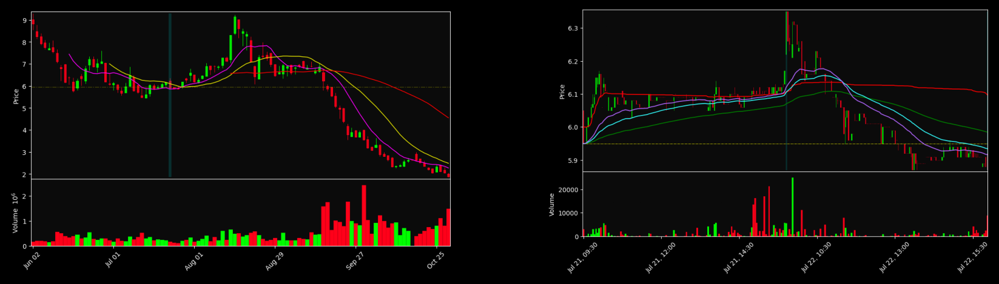

EGHT (2022-07-22)


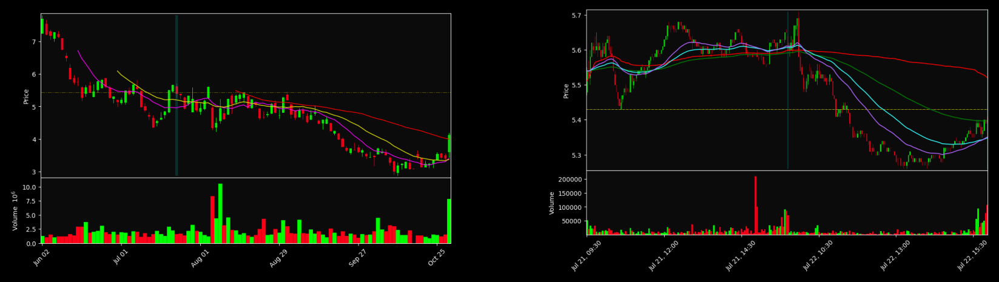

ETWO (2022-07-22)


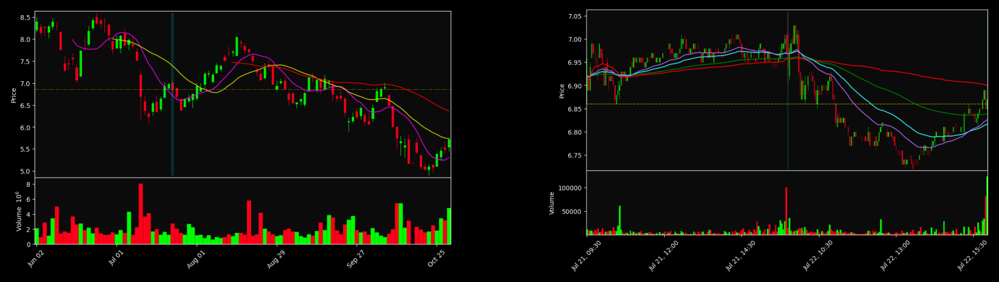

FTCH (2022-07-22)


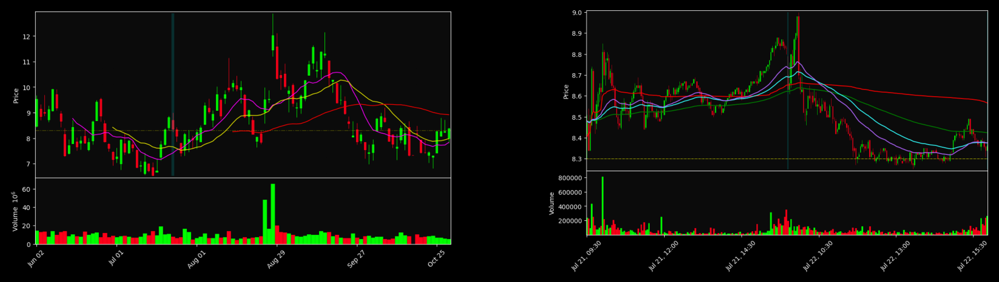

FVRR (2022-07-22)


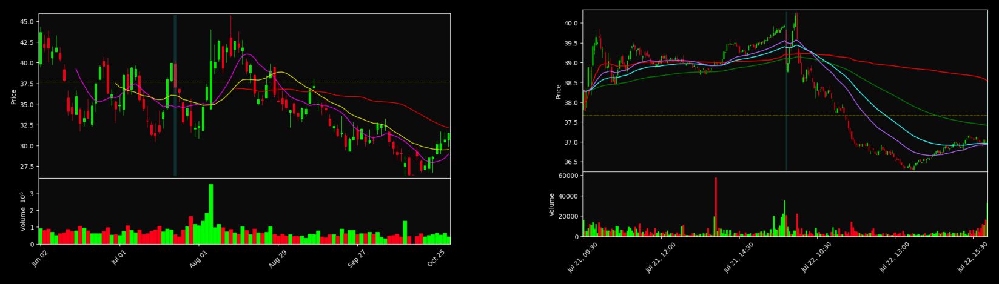

FXLV (2022-07-22)


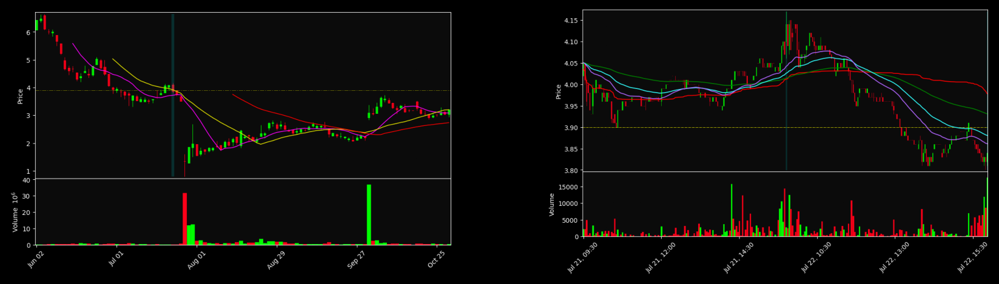

HASI (2022-07-22)


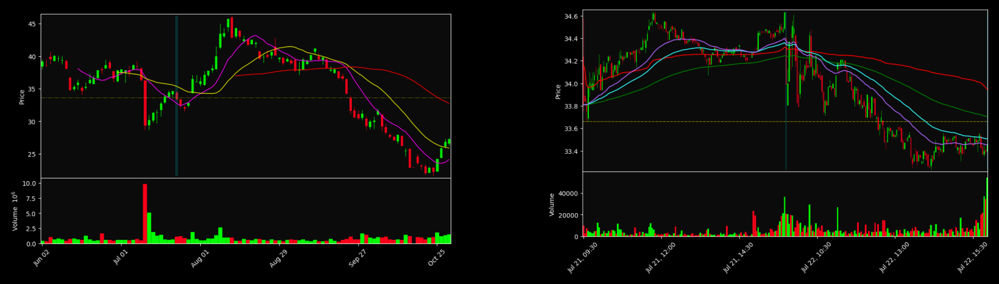

IHRT (2022-07-22)


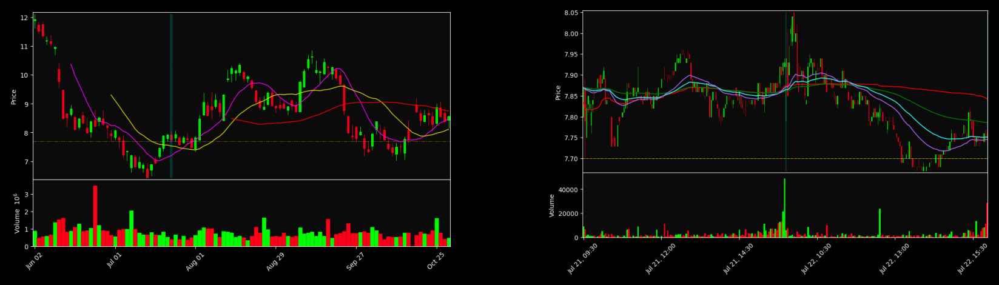

KWR (2022-07-22)


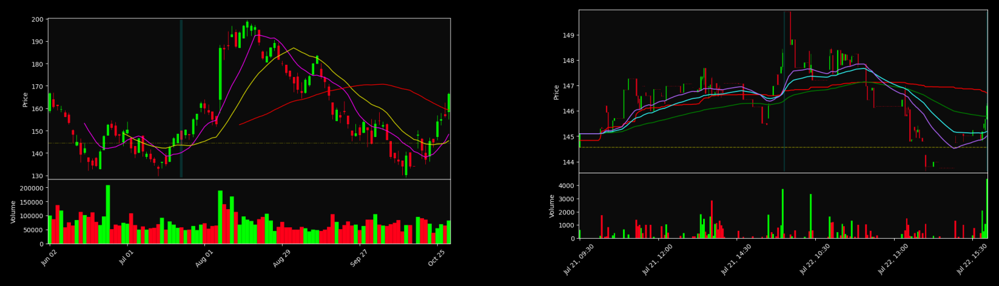

LAZR (2022-07-22)


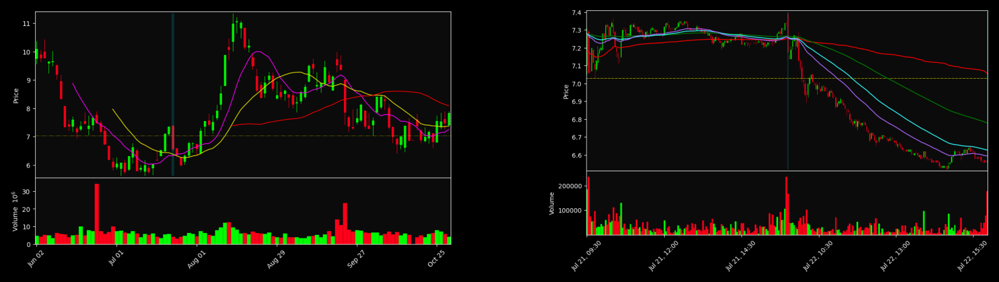

LICY (2022-07-22)


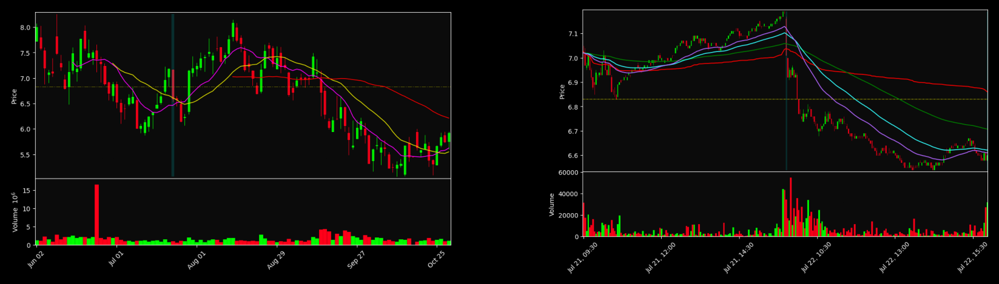

LPSN (2022-07-22)


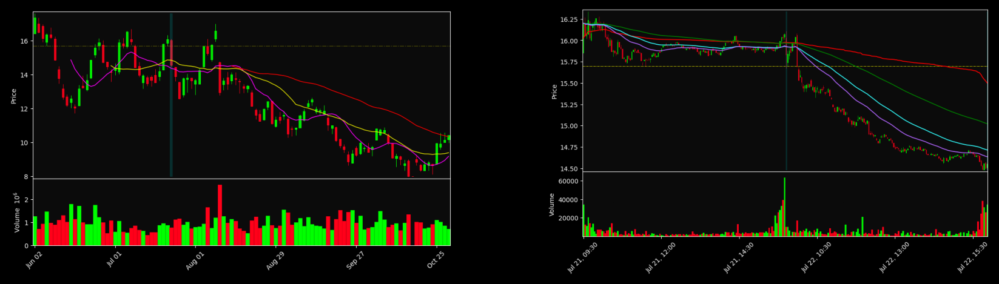

MGNI (2022-07-22)


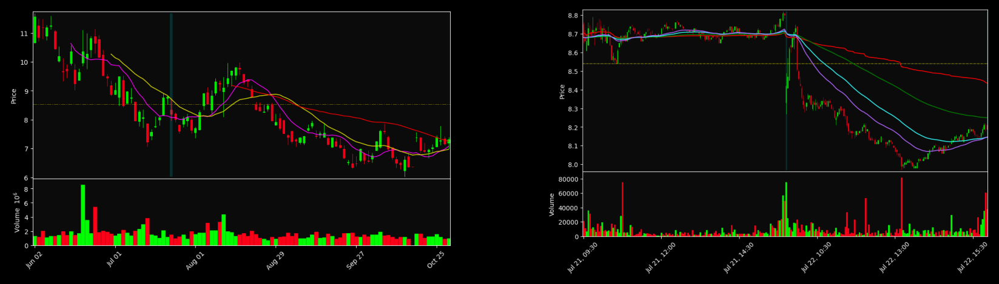

NVEI (2022-07-22)


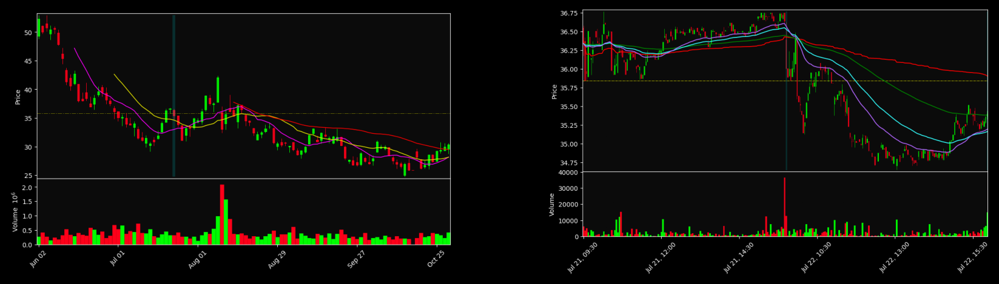

OSTK (2022-07-22)


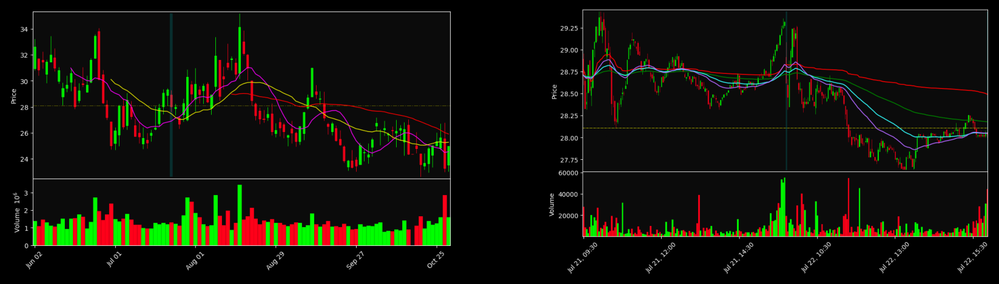

PACB (2022-07-22)


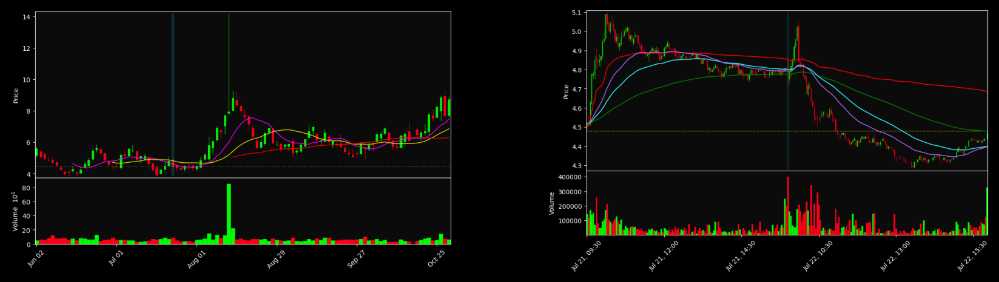

PEGA (2022-07-22)


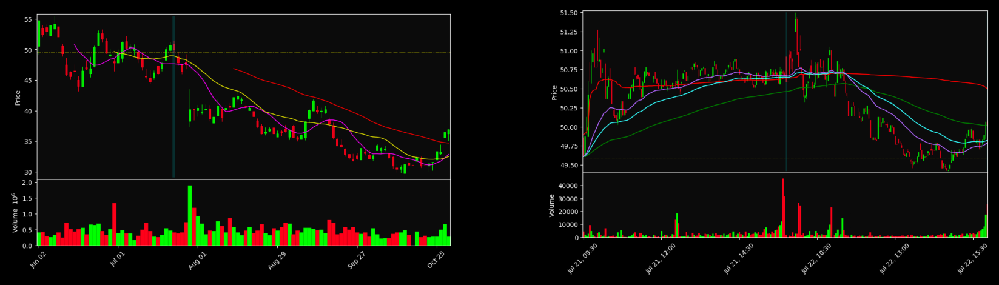

PFHC (2022-07-22)


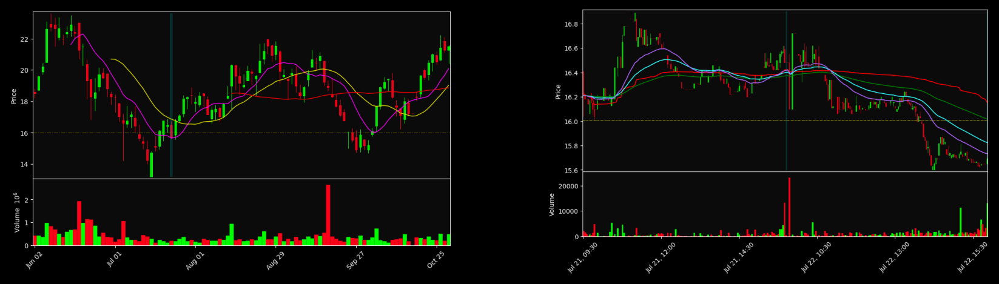

PTRA (2022-07-22)


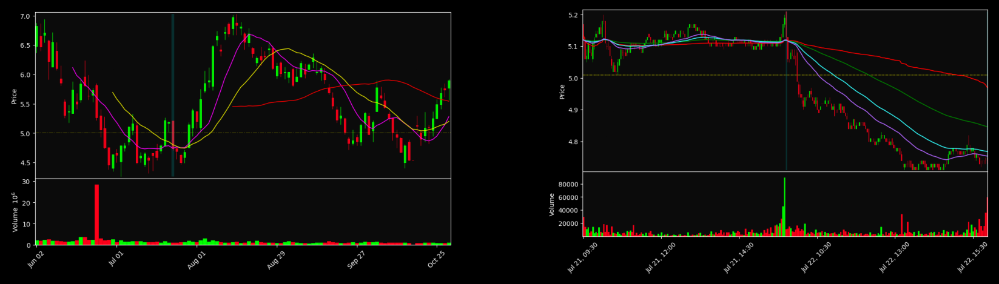

PUBM (2022-07-22)


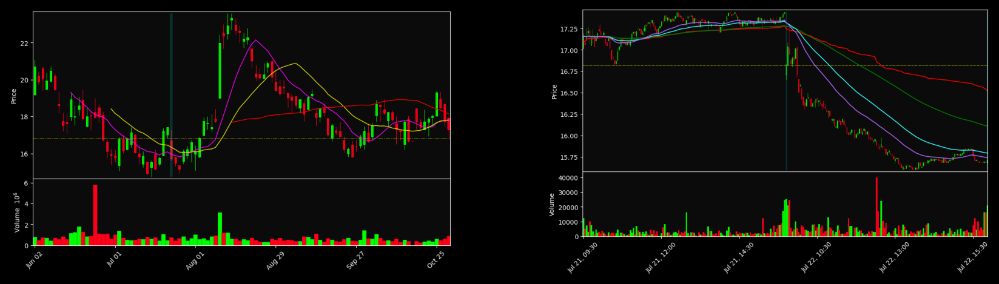

RNG (2022-07-22)


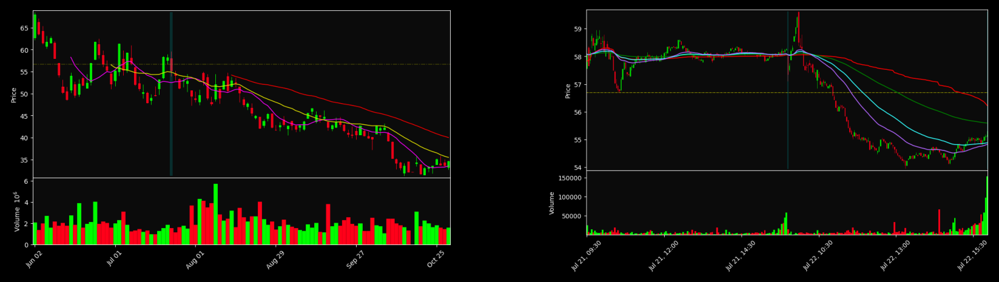

RUTH (2022-07-22)


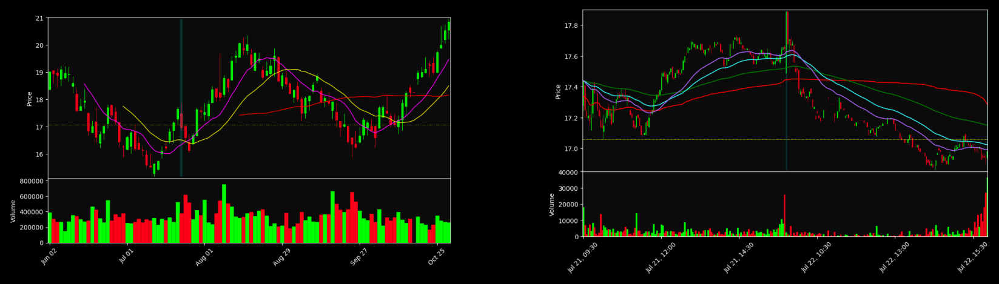

RXT (2022-07-22)


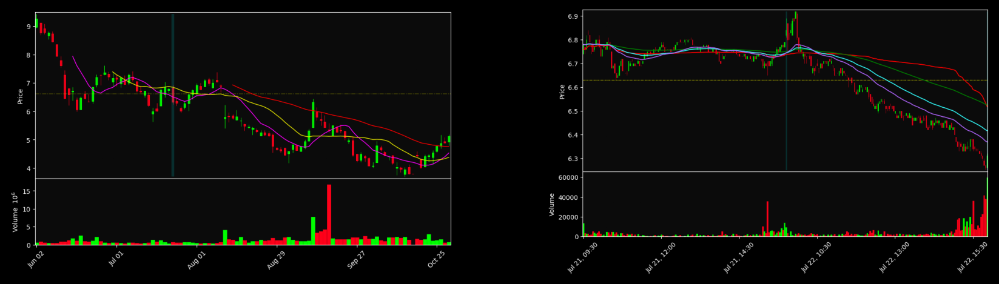

SGH (2022-07-22)


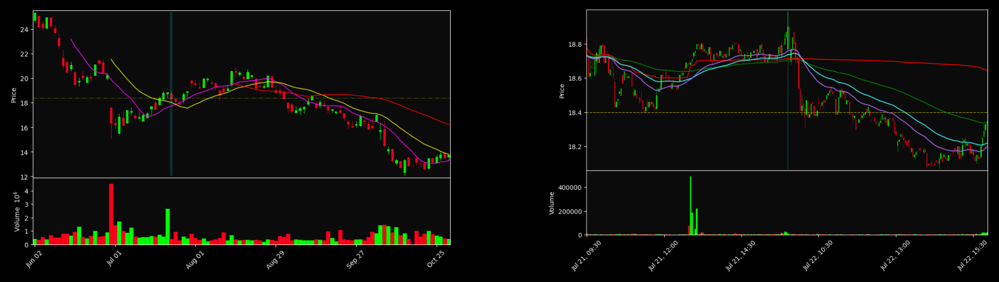

TTGT (2022-07-22)


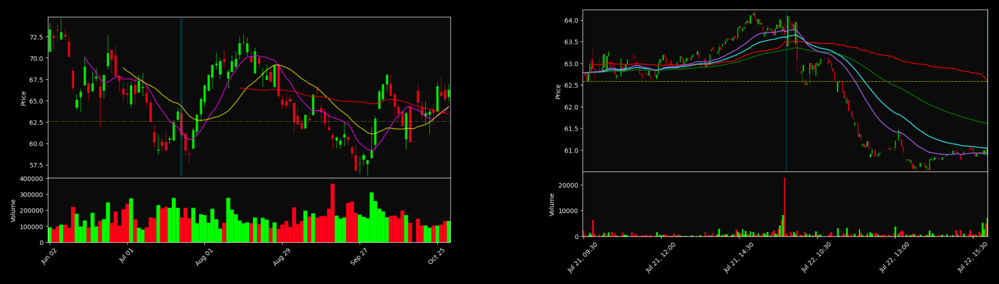

TWKS (2022-07-22)


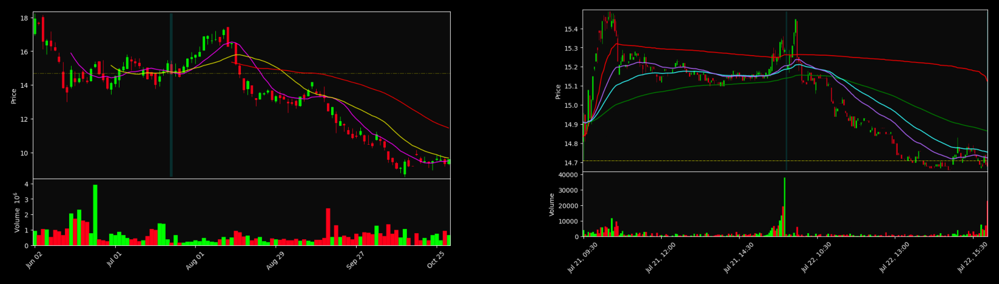

TWLO (2022-07-22)


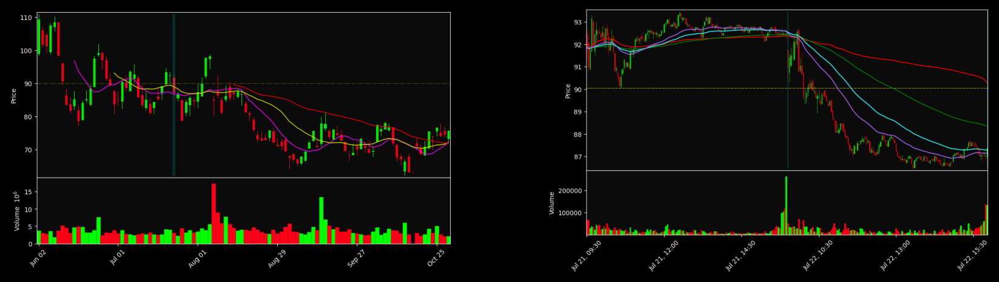

UA (2022-07-22)


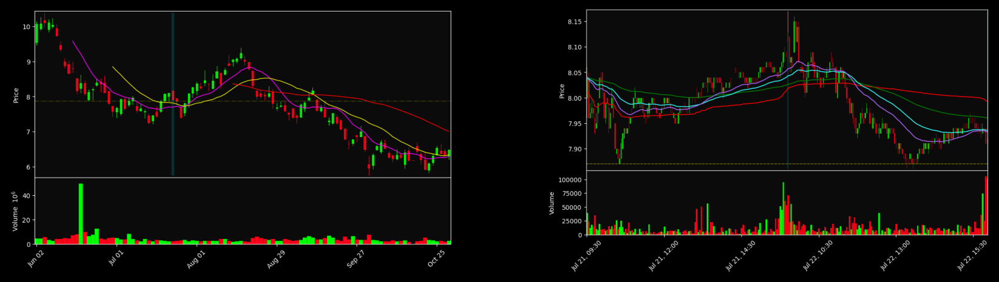

UAA (2022-07-22)


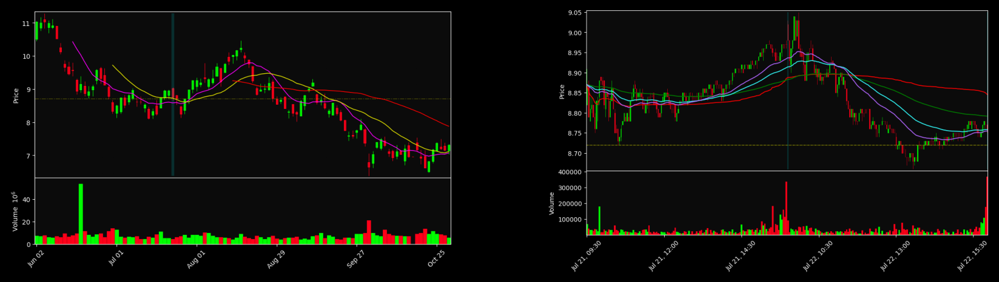

VEDU (2022-07-22)


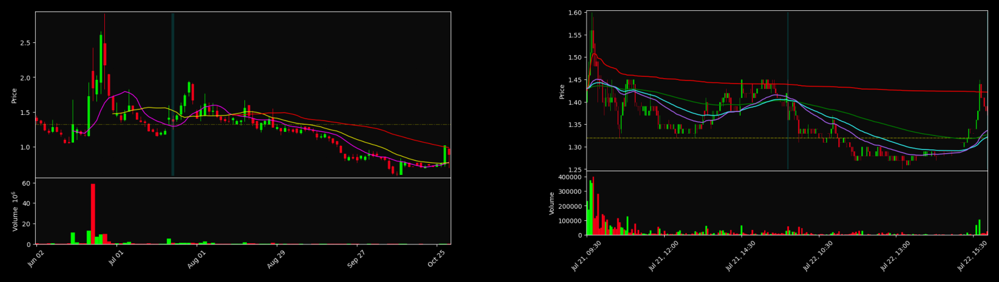

VRNS (2022-07-22)


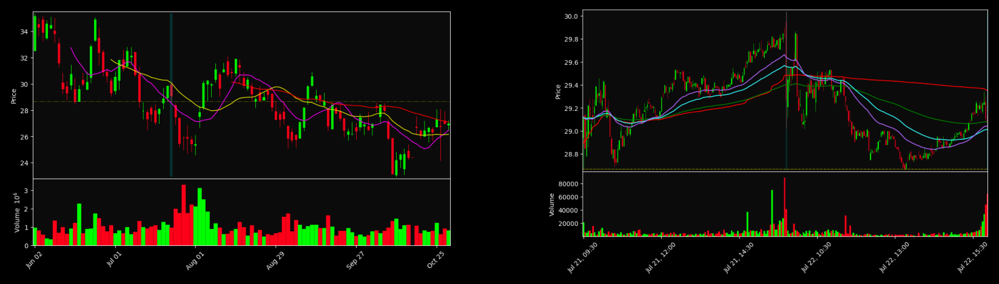

CLB (2022-07-21)


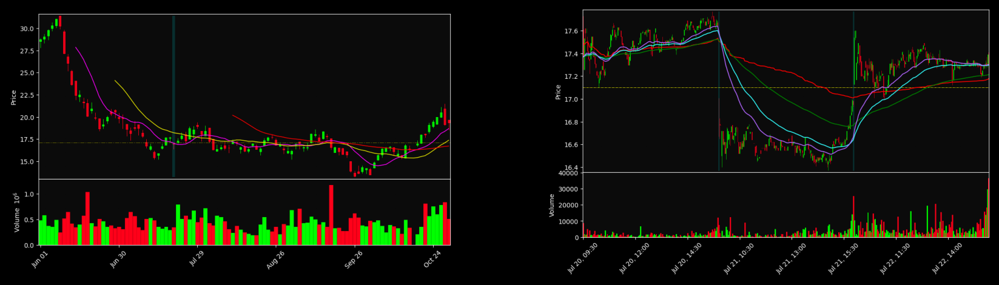

CORZ (2022-07-21)


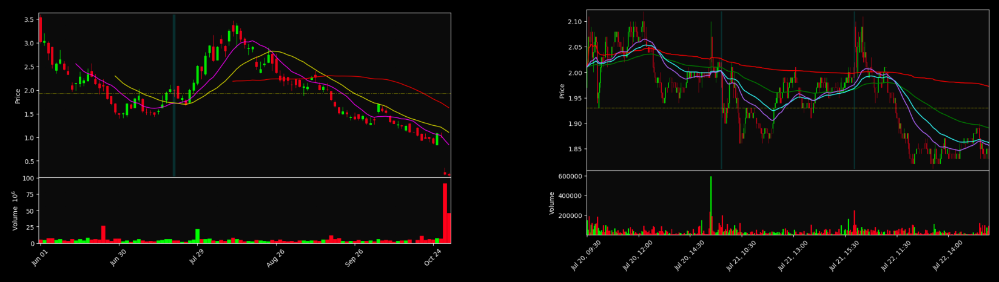

EE (2022-07-21)


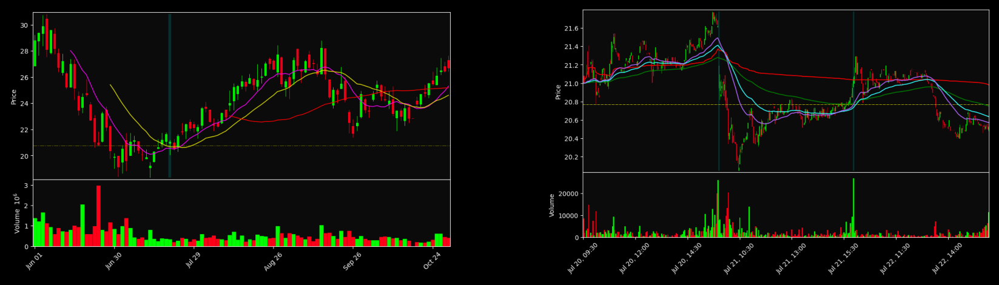

EWCZ (2022-07-21)


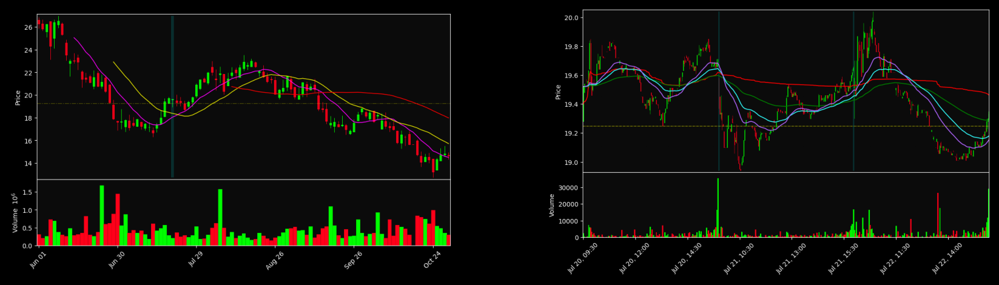

HAYW (2022-07-21)


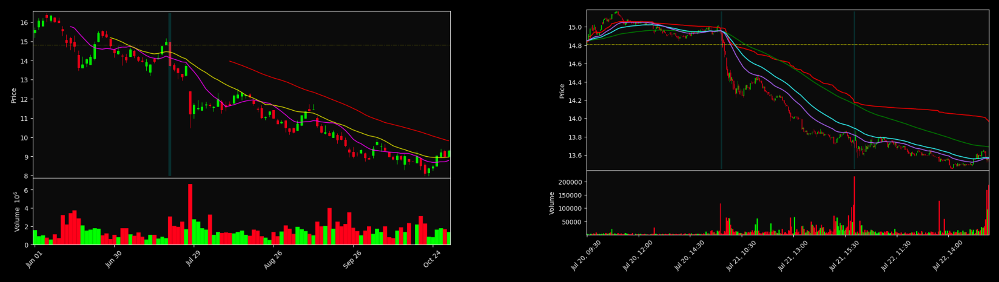

KRNT (2022-07-21)


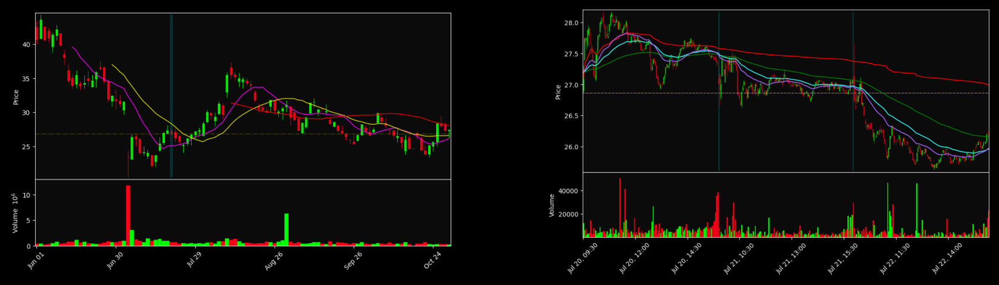

MAG (2022-07-21)


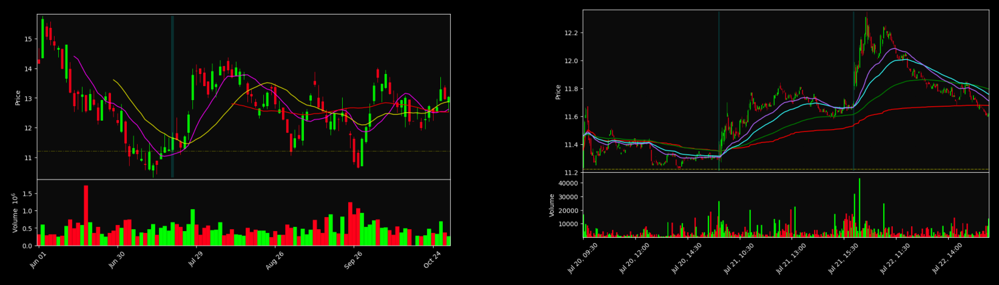

RCL (2022-07-21)


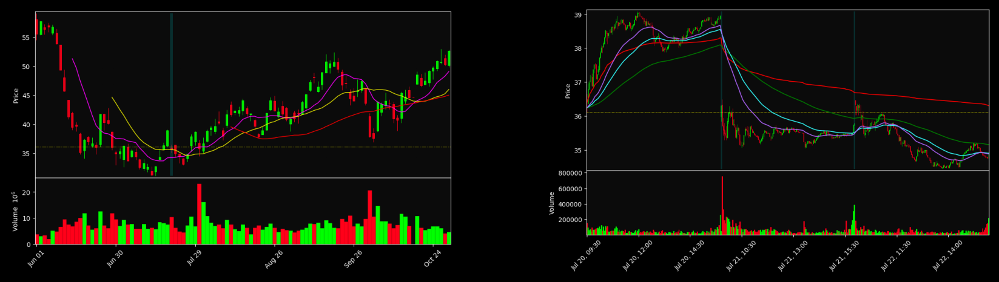

WOOF (2022-07-21)


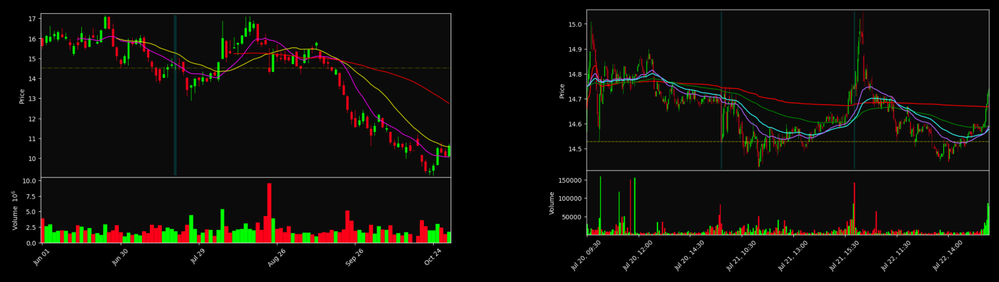

M (2022-07-20)


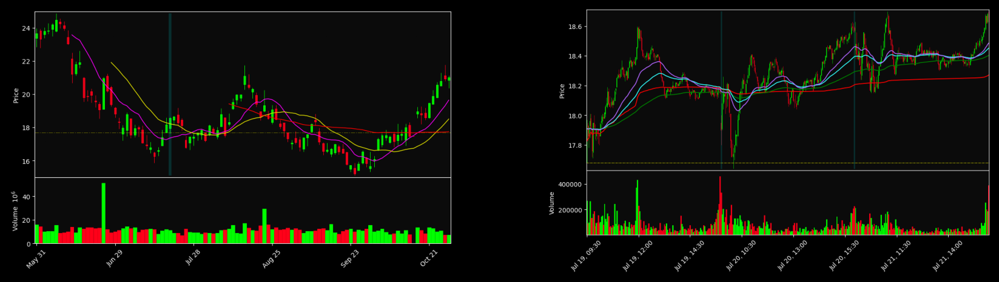

FEAM (2022-07-19)


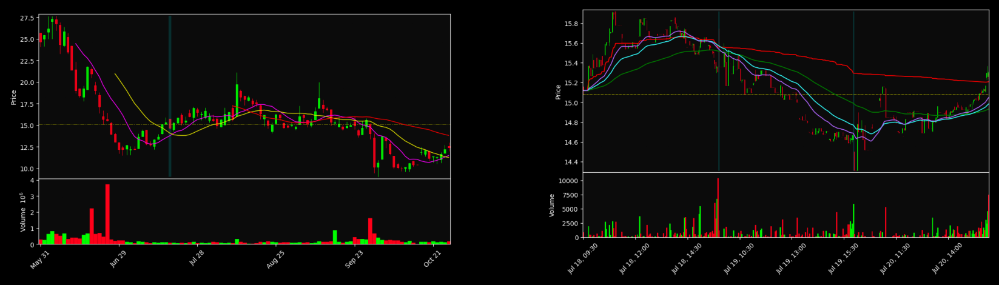

KSS (2022-07-13)


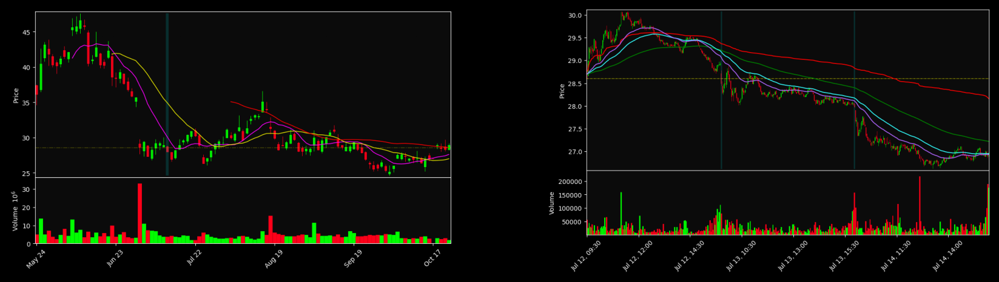

ONTO (2022-07-13)


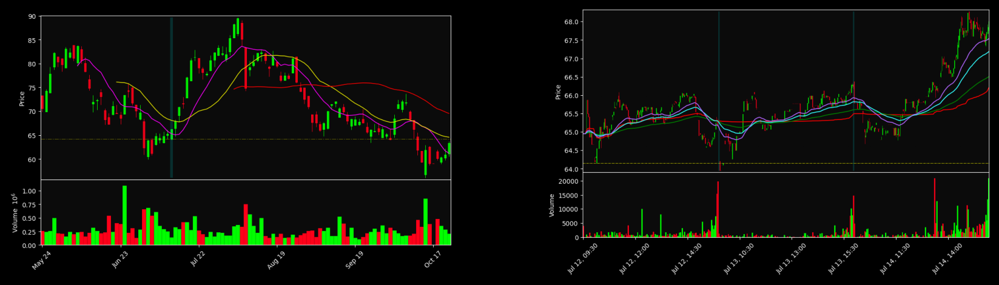

SWIM (2022-07-13)


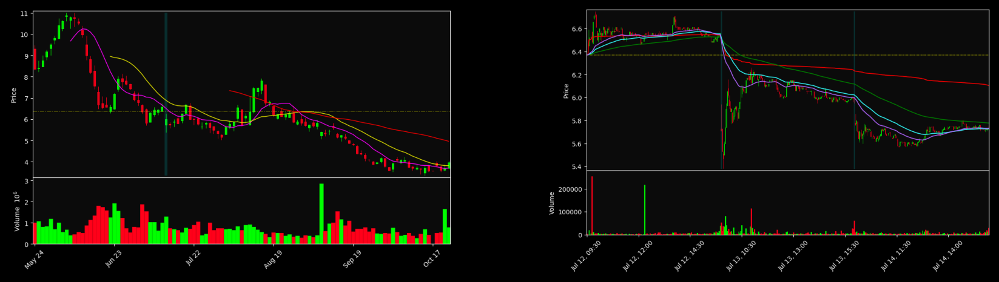

CARG (2022-07-12)


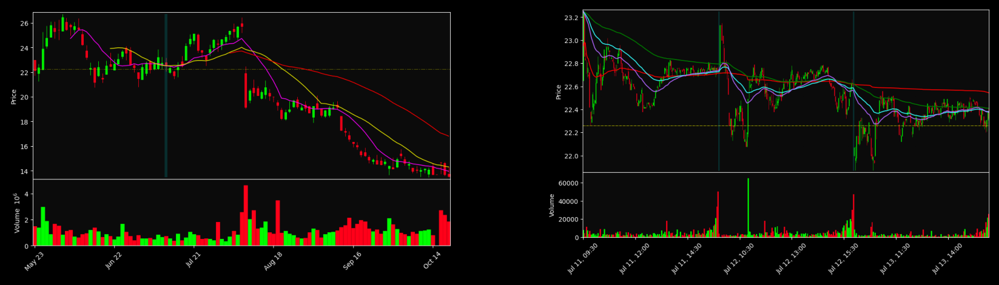

ALIT (2022-07-11)


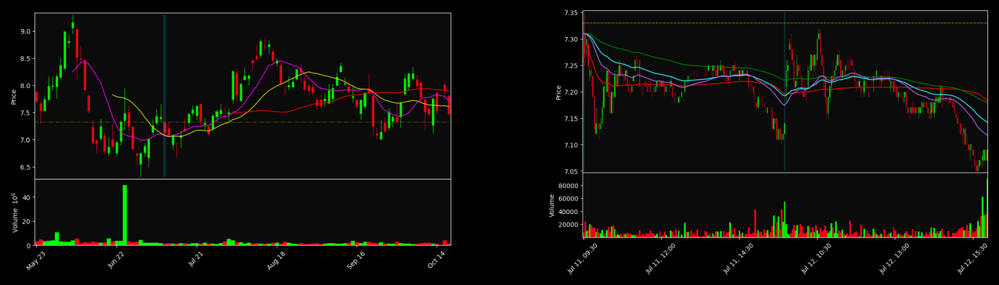

AMBA (2022-07-11)


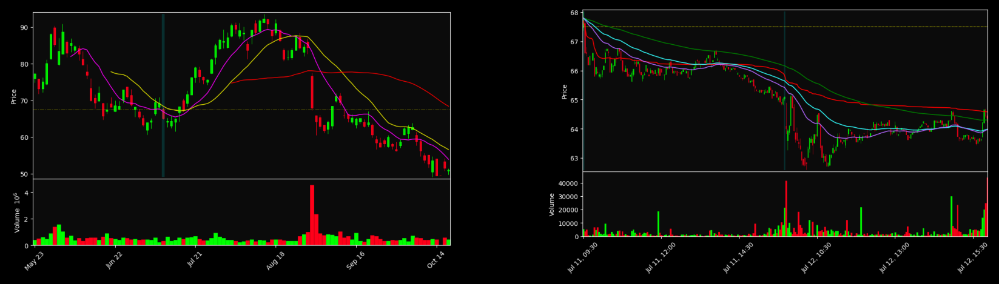

AMD (2022-07-11)


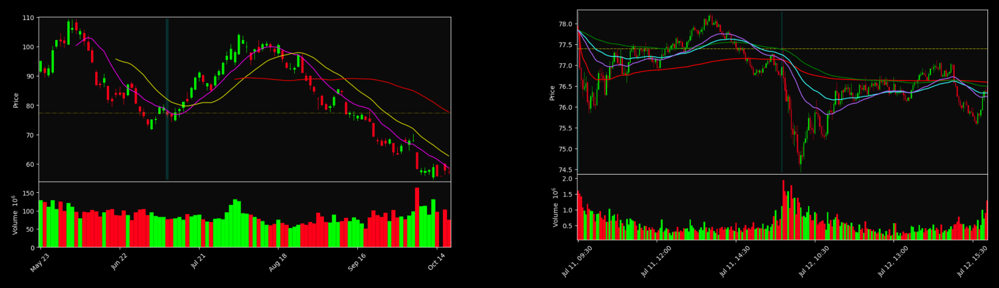

ARHS (2022-07-11)


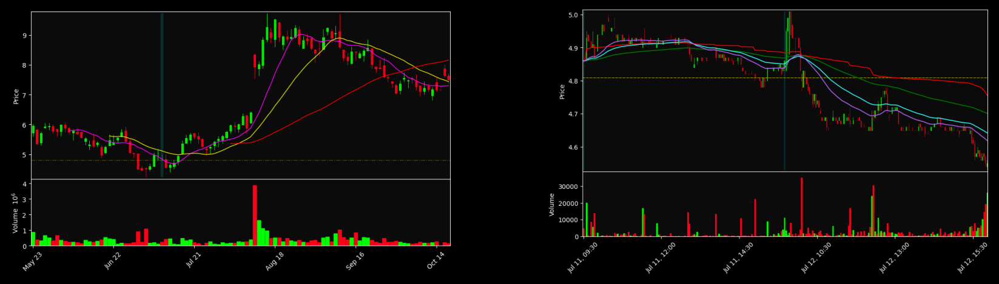

ATHX (2022-07-11)


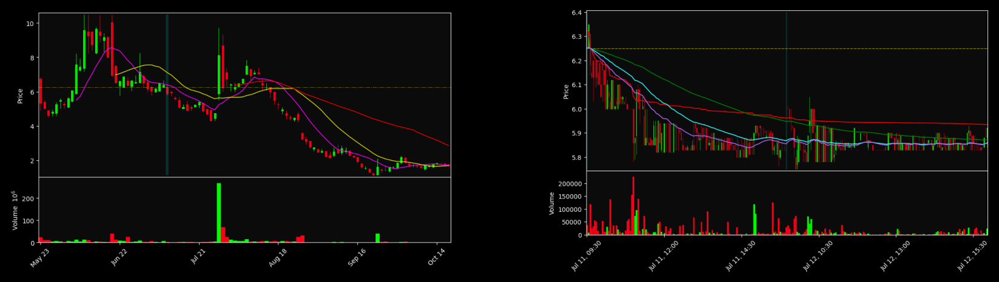

BITO (2022-07-11)


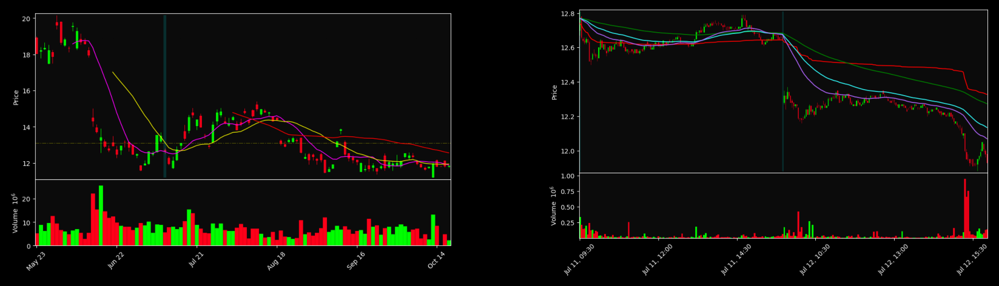

BLND (2022-07-11)


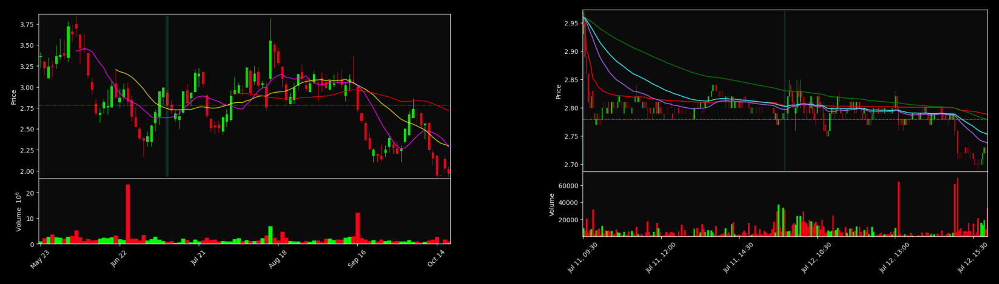

COMP (2022-07-11)


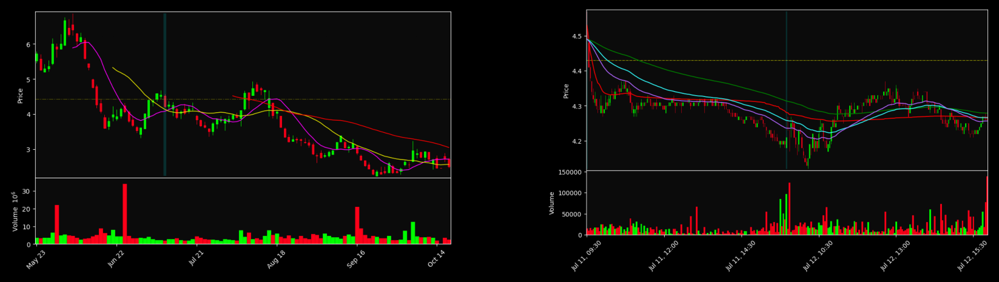

DNAY (2022-07-11)


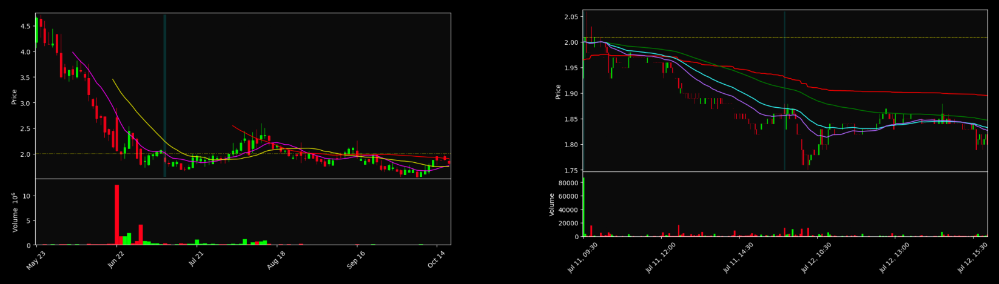

ENVX (2022-07-11)


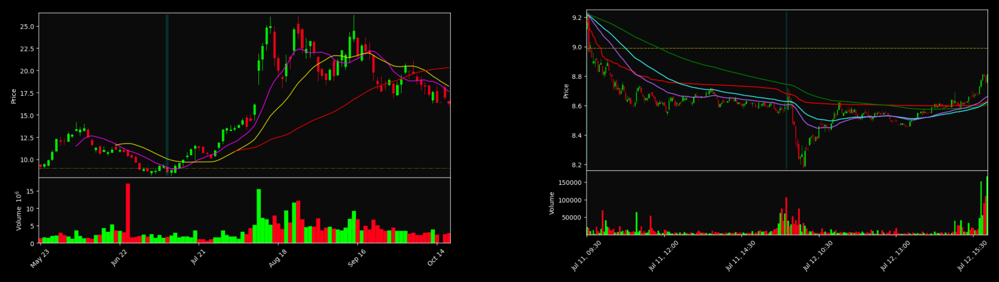

GWH (2022-07-11)


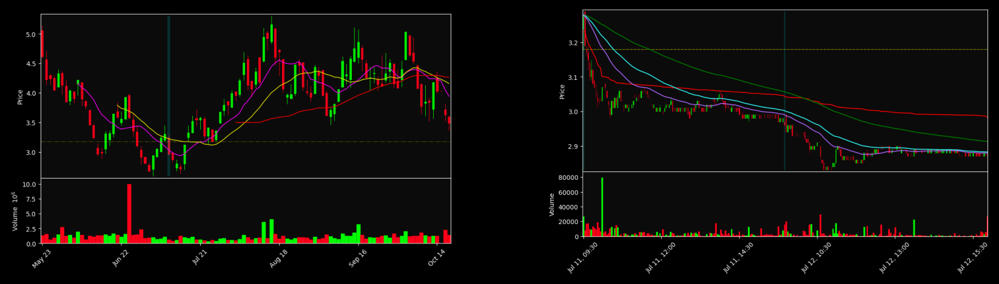

INDI (2022-07-11)


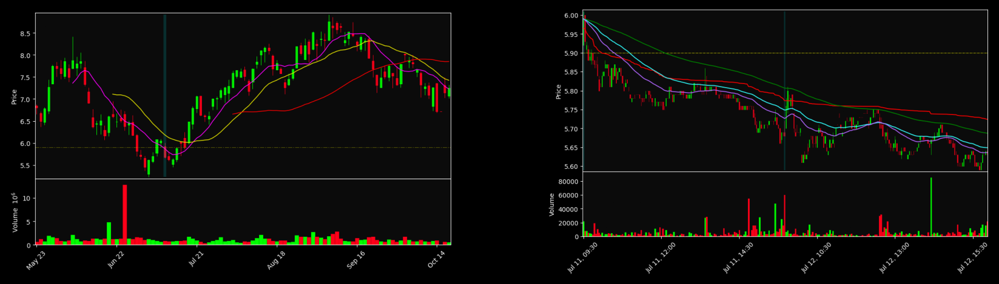

KSCP (2022-07-11)


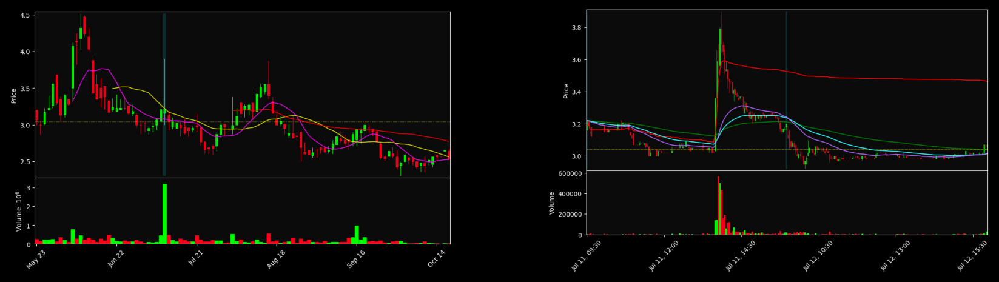

MRVL (2022-07-11)


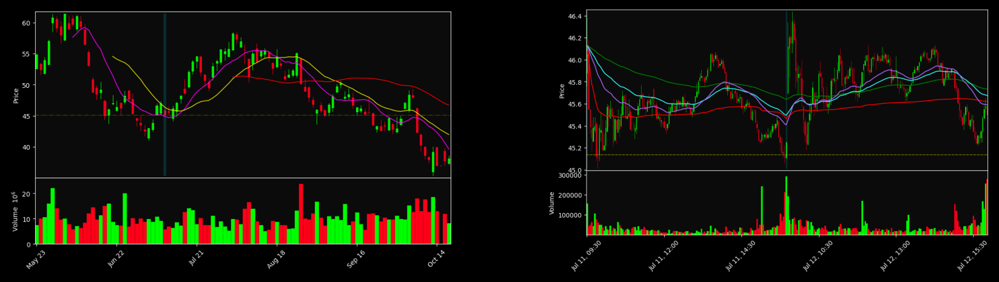

NKLA (2022-07-11)


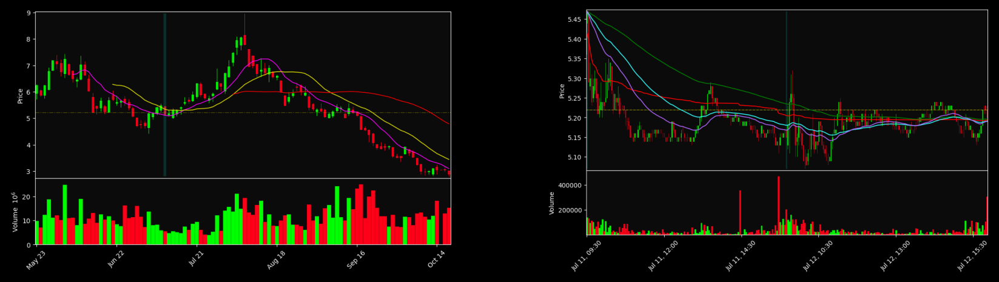

PTRA (2022-07-11)


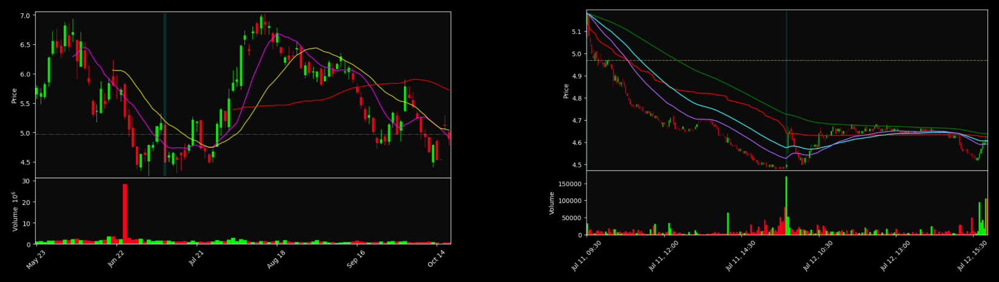

RGTI (2022-07-11)


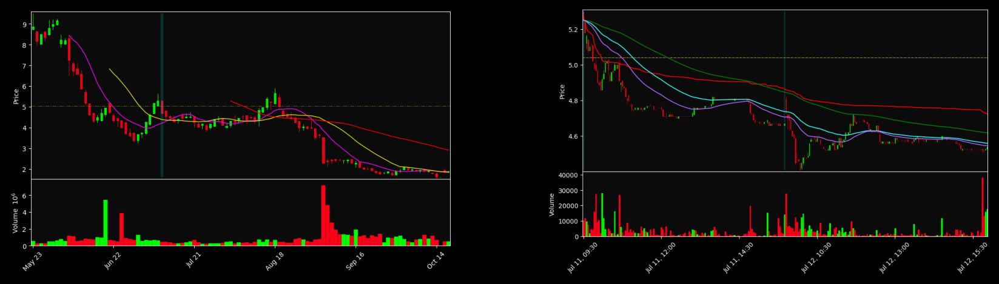

In [3]:
entryOffset = 0
mc = mpf.make_marketcolors(up='#00ff00',down='#ff0019',inherit=True)
mstyledaily  = mpf.make_mpf_style(
    base_mpf_style='nightclouds', 
    mavcolors=['magenta','#e6e600','red','green'],
    marketcolors=mc,
    gridcolor='#0b0b0b'
  )
mstyleintra = mpf.make_mpf_style(
    base_mpf_style='nightclouds', 
    mavcolors=['magenta','#e6e600','red','green'],
    marketcolors=mc,
    gridcolor='#0b0b0b'
  )

for index, row in df.iterrows():
    
    ######################################################
    # fetch daily
    ######################################################
    start = (row['patternTime'] + pd.DateOffset(days=-50)).strftime('%Y-%m-%d')
    end = (row['patternTime'] + pd.DateOffset(days=100)).strftime('%Y-%m-%d')

    url = baseurl + '/chart/' + row['symbol'] + '/d?from=' + encodeUrl(start) + '&to=' + encodeUrl(end)
    chartResponse = requests.get(url)
    chartDf = None
    try:
      chartDf = pd.DataFrame(chartResponse.json()['payload'])
    except Exception as e:
      print(e.__class__)
      print(e)
      print(chartResponse)
      print(chartResponse.text)
      break
    
    chartDf.tickTime = pd.to_datetime(chartDf.tickTime)
    chartDf = chartDf.set_index('tickTime')

    entryDate = row['patternTime']
    entryStr = entryDate.strftime('%Y-%m-%d')
    idx = chartDf.index.get_loc(entryStr)
    if (entryOffset!=0):
      entryStr = chartDf.iloc[[idx+entryOffset]].index.format()[0]
      entryDate = datetime.strptime(entryStr, '%Y-%m-%d')

    print(row['symbol'] + ' (' + row['patternTime'].strftime('%Y-%m-%d') + ')')

    # print('prevday: ' + str(chartDf.iloc[[idx+entryOffset-1]]))
    hlines=(
        chartDf.iloc[[idx+entryOffset-1]]['low'].values[0], 
        # chartDf.iloc[[idx+entryOffset-1]]['high'].values[0]
      )

    addplot = [
        # mpf.make_addplot(chartDf['close'].ewm(span=10, adjust=False).mean(), color='magenta'),
        # mpf.make_addplot(chartDf['close'].ewm(span=21, adjust=False).mean(), color='#e6e600'),
        # mpf.make_addplot(chartDf['close'].ewm(span=50, adjust=False).mean(), color='red'),
        # mpf.make_addplot(chartDf['close'].ewm(span=200,adjust=False).mean(), color='green'),
        # mpf.make_addplot(entryPoint1, scatter=True,  type='scatter', markersize=200, marker=entryMarker, color=entryColor),
        # mpf.make_addplot(entryPoint2, scatter=True,  type='scatter', markersize=50, marker='.', color=entryColor)
    ]

    imgDailyPlot = io.BytesIO()
    mpf.plot(chartDf[start:end], 
             type='candle', 
             volume=True, 
             mav=(10,20,50,200),
             tight_layout=True, 
             figratio=(16,9), 
             addplot=addplot,
             savefig=imgDailyPlot,
             style=mstyledaily,
             hlines=dict(hlines=hlines,colors='y',linewidths=1,alpha=0.5,linestyle='-.'),
             vlines=dict(vlines=[entryStr],colors='c',linewidths=4,alpha=0.2))
    _ = imgDailyPlot.seek(0)

    ######################################################
    # fetch intraday
    ######################################################
    start = (entryDate + pd.DateOffset(days=-1)).strftime('%Y-%m-%d')
    end = (entryDate + pd.DateOffset(days=1)).strftime('%Y-%m-%d')

    url = baseurl + '/chart/' + row['symbol'] + '/3m?from=' + encodeUrl(start) + '&to=' + encodeUrl(end)

    imgIntradayPlot = io.BytesIO()
    chartDf = None
    try:
      chartResponse = requests.get(url)
      if chartResponse.status_code != 200:
        imgIntradayPlot = 'dummy.png'
      else:
        chartDf = pd.DataFrame(chartResponse.json()['payload'])
        chartDf.tickTime = pd.to_datetime(chartDf.tickTime)
        chartDf = chartDf.set_index('tickTime')
        chartDf['VWAP'] = (chartDf.volume * (chartDf.high + chartDf.low) / 2).cumsum() / chartDf.volume.cumsum()

        entryStr = entryDate.replace(hour=9, minute=30)

        addplot  = [
            mpf.make_addplot(chartDf['VWAP'], color="red"),
            mpf.make_addplot(chartDf['close'].ewm(span=150, adjust=False).mean(), color='green'),
            mpf.make_addplot(chartDf['close'].ewm(span=63, adjust=False).mean(), color='#33ffff'),
            mpf.make_addplot(chartDf['close'].ewm(span=36, adjust=False).mean(), color='#b266ff'),
        ]

        vlines=[entryStr, entryDate.replace(hour=15, minute=57)]

        mpf.plot(chartDf[start:end], 
                type='candle', 
                volume=True, 
                tight_layout=True, 
                figratio=(16,9),
                savefig=imgIntradayPlot,
                addplot=addplot,
                style=mstyleintra,
                hlines=dict(hlines=hlines,colors='y',linewidths=(0.5),linestyle='-.'),
                vlines=dict(vlines=vlines,colors='c',linewidths=(2),alpha=0.2))
        _ = imgIntradayPlot.seek(0)
    except Exception as e:
      print(e.__class__)
      print(e)
      print(chartResponse)
      print(chartResponse.text)
      continue

    ######################################################
    # render candlestick & perf charts
    ######################################################
    # daily & intraday charts
    img1 = m_img.imread(imgDailyPlot)
    img2 = m_img.imread(imgIntradayPlot)
    fig = plt.figure(figsize=(21,14))
    ax1 = fig.add_subplot(221)
    ax2 = fig.add_subplot(222)
    ax1.set_axis_off()
    ax2.set_axis_off()
    ax1.imshow(img1)
    ax2.imshow(img2)
    plt.show()
